# Detección de Defectos en Imágenes con Autoencoder Variacional (VAE)

**Autora:** Julia García Vega

**Descripción:**
<br>
Este notebook implementa autocodificadores variacionales para detección no supervisada de anomalías en imágenes industriales. El modelo aprende una representación probabilística del espacio latente a partir de imágenes normales, permitiendo reconstrucciones fieles. Las imágenes con defectos presentan errores de reconstrucción en zonas anómalas, lo que posibilita su detección y localización.

Se comparan varias arquitecturas: básica (convolucional estándar), con Batch Normalization y Dropout, profunda (más capas y filtros) y con bloques residuales para mejorar el entrenamiento.  

Para la evaluación se utilizó el dataset MVTec AD.


## Configuración inicial

In [ ]:
from google.colab import files
import os
from sklearn.model_selection import train_test_split
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from tensorflow.keras import layers
from PIL import Image
from tensorflow.keras import layers, Model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from sklearn.metrics import roc_auc_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import precision_score, recall_score, f1_score, classification_report
from keras.saving import register_keras_serializable
from tensorflow.keras import backend as K
import gc

In [3]:
DATA_DIR = "/content/mvtec_dataset/cable"
IMG_SIZE = 256

## Importación de los datos

Se procede a descargar el conjunto de datos MVTec Anomaly Detection desde Kaggle, un dataset ampliamente utilizado para la detección de anomalías en imágenes industriales. Este conjunto incluye imágenes de diferentes objetos y texturas, con categorías que presentan ejemplos tanto de condiciones normales como de defectos.

Para este proyecto, se selecciona una categoría específica del dataset, en concreto cable, la cual contiene imágenes normales para entrenamiento y validación, junto con imágenes defectuosas agrupadas en distintas subcategorías. Además, se dispone de máscaras binarias en la carpeta de ground_truth que indican la ubicación exacta de los defectos para evaluación de segmentación.

Esta organización facilita la preparación y carga de datos para el entrenamiento no supervisado y la evaluación tanto de la detección como de la localización de anomalías.


In [4]:
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"juliagarve","key":"5649c5612324fd329c47d1502707613b"}'}

In [5]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [6]:
!kaggle datasets download -d ipythonx/mvtec-ad

Dataset URL: https://www.kaggle.com/datasets/ipythonx/mvtec-ad
License(s): copyright-authors
100% 4.91G/4.91G [01:58<00:00, 51.6MB/s]
100% 4.91G/4.91G [01:59<00:00, 44.3MB/s]


In [7]:
!mkdir -p mvtec_dataset
!unzip -q mvtec-ad.zip -d mvtec_dataset/

In [1]:
def load_train_image_paths(train_dir):
    normal_dir = os.path.join(train_dir, "good")
    image_paths = sorted([os.path.join(normal_dir, f) for f in os.listdir(normal_dir)])
    return image_paths

def load_test_image_and_mask_paths(test_dir, gt_dir):
    image_paths = []
    mask_paths = []
    labels = []

    # Normales (sin máscara)
    normal_dir = os.path.join(test_dir, "good")
    normal_images = sorted([os.path.join(normal_dir, f) for f in os.listdir(normal_dir)])
    image_paths.extend(normal_images)
    mask_paths.extend([None] * len(normal_images))
    labels.extend([0] * len(normal_images))

    # Defectuosas con máscaras
    for defect in os.listdir(test_dir):
        if defect == "good":
            continue
        defect_dir = os.path.join(test_dir, defect)
        mask_dir = os.path.join(gt_dir, defect)
        defect_images = sorted([os.path.join(defect_dir, f) for f in os.listdir(defect_dir)])

        for img_path in defect_images:
            fname = os.path.basename(img_path)
            mask_path = os.path.join(mask_dir, fname).rsplit(".", 1)[0] + "_mask.png"
            image_paths.append(img_path)
            mask_paths.append(mask_path)
            labels.append(1)

    return image_paths, mask_paths, labels

In [4]:
train_dir = os.path.join(DATA_DIR, "train")
test_dir = os.path.join(DATA_DIR, "test")
gt_dir = os.path.join(DATA_DIR, "ground_truth")

train_image_paths = load_train_image_paths(train_dir)
test_image_paths, test_mask_paths, test_labels = load_test_image_and_mask_paths(test_dir, gt_dir)

In [10]:
print(f"Train images: {len(train_image_paths)}")
print(f"Test images: {len(test_image_paths)}")
print(f"Test masks: {len(test_mask_paths)}")
print(f"Test labels: {len(test_labels)}")

Train images: 224
Test images: 150
Test masks: 150
Test labels: 150


In [11]:
print("Ejemplos de imágenes de entrenamiento:")
for path in train_image_paths[:3]:
    print(" -", path)

print("\nEjemplos de imágenes de test:")
for i in range(3):
    print(f" - {test_image_paths[i]} | Mask: {test_mask_paths[i]} | Label: {test_labels[i]}")
for i in range(-3, 0):
    print(f" - {test_image_paths[i]} | Mask: {test_mask_paths[i]} | Label: {test_labels[i]}")

Ejemplos de imágenes de entrenamiento:
 - /content/mvtec_dataset/cable/train/good/000.png
 - /content/mvtec_dataset/cable/train/good/001.png
 - /content/mvtec_dataset/cable/train/good/002.png

Ejemplos de imágenes de test:
 - /content/mvtec_dataset/cable/test/good/000.png | Mask: None | Label: 0
 - /content/mvtec_dataset/cable/test/good/001.png | Mask: None | Label: 0
 - /content/mvtec_dataset/cable/test/good/002.png | Mask: None | Label: 0
 - /content/mvtec_dataset/cable/test/combined/008.png | Mask: /content/mvtec_dataset/cable/ground_truth/combined/008_mask.png | Label: 1
 - /content/mvtec_dataset/cable/test/combined/009.png | Mask: /content/mvtec_dataset/cable/ground_truth/combined/009_mask.png | Label: 1
 - /content/mvtec_dataset/cable/test/combined/010.png | Mask: /content/mvtec_dataset/cable/ground_truth/combined/010_mask.png | Label: 1


## Visualización de imágenes, etiquetas y su máscara correspondiente

In [12]:
def show_one_per_class(image_paths, mask_paths, labels):
    """
    Muestra una imagen sin defecto y una por cada tipo de defecto.
    """
    seen_defects = {}
    good_shown = False
    selected = []

    for img_path, mask_path, label in zip(image_paths, mask_paths, labels):
        # Si es imagen sin defecto
        if label == 0 and not good_shown:
            selected.append((img_path, mask_path, "Good"))
            good_shown = True
        elif label == 1:
            # Obtener nombre del defecto desde la ruta (ej: "missing_cable")
            defect_type = os.path.basename(os.path.dirname(img_path))
            if defect_type not in seen_defects:
                selected.append((img_path, mask_path, defect_type))
                seen_defects[defect_type] = True

        # Parar si ya tenemos suficiente
        if good_shown and len(seen_defects) >= 8:
            break

    # Mostrar
    plt.figure(figsize=(15, 3 * len(selected)))
    for i, (img_path, mask_path, label) in enumerate(selected):
        img = load_img(img_path, target_size=(256, 256))
        img_arr = img_to_array(img) / 255.0

        plt.subplot(len(selected), 3, i * 3 + 1)
        plt.imshow(img_arr)
        plt.title(f"Image ({label})")
        plt.axis('off')

        if mask_path is not None and os.path.exists(mask_path):
            mask = load_img(mask_path, color_mode='grayscale', target_size=(256, 256))
            mask_arr = img_to_array(mask) / 255.0
            plt.subplot(len(selected), 3, i * 3 + 2)
            plt.imshow(mask_arr.squeeze(), cmap='gray')
            plt.title("Mask")
            plt.axis('off')
        else:
            plt.subplot(len(selected), 3, i * 3 + 2)
            plt.text(0.5, 0.5, "No Mask", ha='center', va='center')
            plt.axis('off')

        plt.subplot(len(selected), 3, i * 3 + 3)
        plt.text(0.5, 0.5, f"Label: {label}", ha='center', va='center', fontsize=14)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

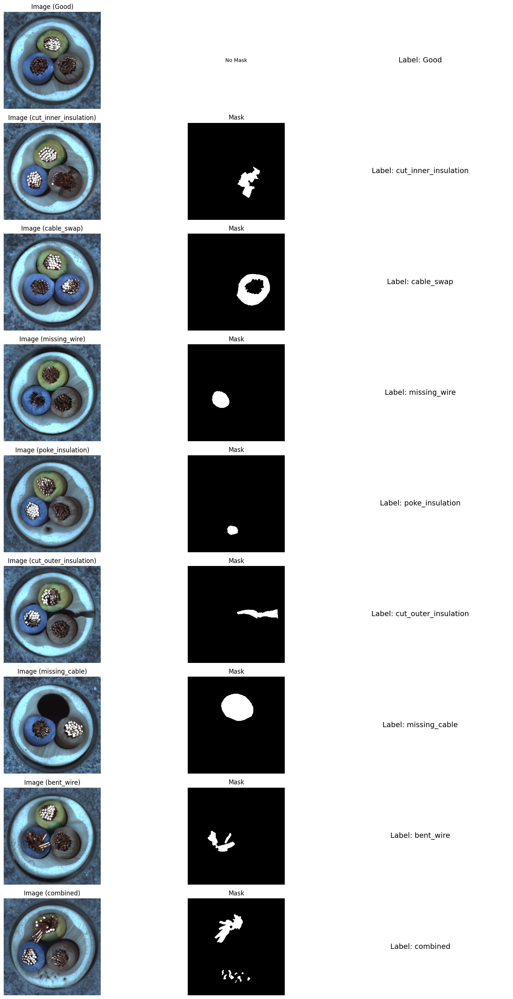

In [13]:
show_one_per_class(test_image_paths, test_mask_paths, test_labels)

## Preprocesamiento del conjunto de datos


In [5]:
train_paths, val_paths = train_test_split(train_image_paths, test_size=0.2, random_state=42)

In [6]:
def create_black_masks(image_paths, target_size=(256, 256), output_dir=None):
    os.makedirs(output_dir, exist_ok=True)
    for path in image_paths:
        fname = os.path.basename(path)
        mask_name = fname.rsplit('.', 1)[0] + "_mask.png"
        mask_path = os.path.join(output_dir, mask_name)

        if not os.path.exists(mask_path):
            black = np.zeros(target_size, dtype=np.uint8)
            Image.fromarray(black).save(mask_path)

In [7]:
create_black_masks(
    [p for i, p in enumerate(test_image_paths) if test_labels[i] == 0],
    target_size=(256, 256),
    output_dir=os.path.join(gt_dir, "good")
)

In [8]:
for i in range(len(test_image_paths)):
    if test_labels[i] == 0:
        fname = os.path.basename(test_image_paths[i])
        mask_name = fname.rsplit('.', 1)[0] + "_mask.png"
        test_mask_paths[i] = os.path.join(gt_dir, "good", mask_name)

In [9]:
def preprocess_image(path, target_size=(256, 256)):
    img = tf.io.read_file(path)
    img = tf.image.decode_png(img, channels=3)
    img = tf.image.resize(img, target_size)
    img = tf.cast(img, tf.float32) / 255.0
    return img

def preprocess_mask(path, target_size=(256, 256)):
    mask = tf.io.read_file(path)
    mask = tf.image.decode_png(mask, channels=1)
    mask = tf.image.resize(mask, target_size)
    mask = tf.cast(mask, tf.float32) / 255.0
    return tf.squeeze(mask)

def augment_image(img):
    img = tf.image.random_flip_left_right(img)
    img = tf.image.random_brightness(img, 0.1)
    img = tf.image.random_contrast(img, 0.8, 1.2)
    img = tf.clip_by_value(img, 0.0, 1.0)
    return img

def load_dataset(image_paths, augment=False, batch_size=32, shuffle=True):
    ds = tf.data.Dataset.from_tensor_slices(image_paths)
    ds = ds.map(preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)
    if augment:
        ds = ds.map(augment_image, num_parallel_calls=tf.data.AUTOTUNE)
    if shuffle:
        ds = ds.shuffle(buffer_size=1000)
    ds = ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    ds = ds.map(lambda x: (x, x), num_parallel_calls=tf.data.AUTOTUNE)
    return ds

def load_preprocessed_images_and_masks(image_paths, mask_paths, target_size=(256, 256)):
    originals = []
    masks = []

    for img_path, mask_path in zip(image_paths, mask_paths):
        img_tensor = preprocess_image(img_path, target_size)
        mask_tensor = preprocess_mask(mask_path, target_size)

        originals.append(img_tensor.numpy())
        masks.append(mask_tensor.numpy())

    return np.array(originals), np.array(masks)

In [10]:
train_ds = load_dataset(train_paths, augment=True)
val_ds = load_dataset(val_paths, augment=False)
test_images, test_masks = load_preprocessed_images_and_masks(test_image_paths, test_mask_paths)

In [20]:
print(train_ds)
print(val_ds)

<_ParallelMapDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None))>
<_ParallelMapDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None))>


In [21]:
print(test_images.shape)
print(test_masks.shape)
print(len(test_labels))
print(np.unique(test_labels))

(150, 256, 256, 3)
(150, 256, 256)
150
[0 1]


Batch shape: (32, 256, 256, 3)


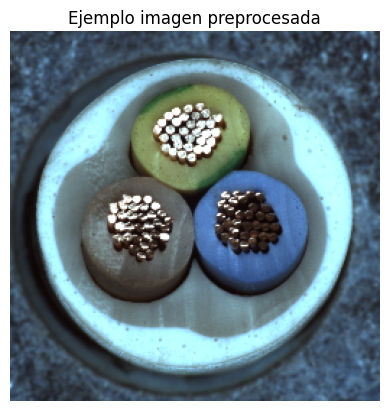

In [22]:
for batch in train_ds.take(1):
    images, targets = batch
    print("Batch shape:", images.shape)

    plt.imshow(images[0].numpy())
    plt.title("Ejemplo imagen preprocesada")
    plt.axis('off')
    plt.show()

## Construcción de distintas arquitecturas de VAE

In [11]:
# Sampling layer
@register_keras_serializable()
class Sampling(layers.Layer):
    def call(self, inputs):
        mu, log_var = inputs
        epsilon = tf.random.normal(shape=tf.shape(mu))
        return mu + tf.exp(0.5 * log_var) * epsilon

# VAE model
@register_keras_serializable()
class VAE(Model):
    def __init__(self, encoder, decoder, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.sampling = Sampling()
        self.total_loss_tracker = tf.keras.metrics.Mean(name="total_loss")
        self.beta = 1.0

    def compile(self, optimizer, beta=1.0):
        super(VAE, self).compile()
        self.optimizer = optimizer
        self.beta = beta

    def reconstruction_loss(self, x, x_recon):
        # MSE por imagen (suma sobre pixeles, media sobre batch)
        return tf.reduce_mean(tf.reduce_sum(tf.square(x - x_recon), axis=[1, 2, 3]))

    def train_step(self, data):
        if isinstance(data, tuple):
            data = data[0]
        with tf.GradientTape() as tape:
            mu, log_var = self.encoder(data)
            z = self.sampling((mu, log_var))
            reconstruction = self.decoder(z)
            recon_loss = self.reconstruction_loss(data, reconstruction)
            kl_loss = -0.5 * tf.reduce_mean(tf.reduce_sum(1 + log_var - tf.square(mu) - tf.exp(log_var), axis=1))
            total_loss = recon_loss + self.beta * kl_loss
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        self.total_loss_tracker.update_state(total_loss)
        return {"loss": self.total_loss_tracker.result()}

    def test_step(self, data):
        if isinstance(data, tuple):
            data = data[0]
        mu, log_var = self.encoder(data)
        z = self.sampling((mu, log_var))
        reconstruction = self.decoder(z)
        recon_loss = self.reconstruction_loss(data, reconstruction)
        kl_loss = -0.5 * tf.reduce_mean(tf.reduce_sum(1 + log_var - tf.square(mu) - tf.exp(log_var), axis=1))
        total_loss = recon_loss + self.beta * kl_loss
        return {"loss": total_loss}

    def call(self, inputs):
        mu, log_var = self.encoder(inputs)
        z = self.sampling((mu, log_var))
        return self.decoder(z)

### Arquitectura básica

In [ ]:
# Encoder
def build_encoder(latent_dim=64, input_shape=(IMG_SIZE, IMG_SIZE, 3)):
    inputs = layers.Input(shape=input_shape)
    x = layers.Conv2D(32, 4, strides=2, padding='same', activation='relu')(inputs)
    x = layers.Conv2D(64, 4, strides=2, padding='same', activation='relu')(x)
    x = layers.Conv2D(128, 4, strides=2, padding='same', activation='relu')(x)
    x = layers.Flatten()(x)
    mu = layers.Dense(latent_dim, name="mu")(x)
    log_var = layers.Dense(latent_dim, name="log_var")(x)
    return Model(inputs, [mu, log_var], name="encoder")

# Decoder
def build_decoder(latent_dim=64):
    latent_inputs = layers.Input(shape=(latent_dim,))
    x = layers.Dense(32*32*128, activation='relu')(latent_inputs)
    x = layers.Reshape((32, 32, 128))(x)
    x = layers.Conv2DTranspose(128, 4, strides=2, padding='same', activation='relu')(x)
    x = layers.Conv2DTranspose(64, 4, strides=2, padding='same', activation='relu')(x)
    x = layers.Conv2DTranspose(32, 4, strides=2, padding='same', activation='relu')(x)
    outputs = layers.Conv2DTranspose(3, 3, activation='sigmoid', padding='same')(x)
    return Model(latent_inputs, outputs, name="decoder")

### Arquitectura básica con regularización

In [ ]:
def build_encoder_bn_dropout(latent_dim=64, input_shape=(IMG_SIZE, IMG_SIZE, 3)):
    inputs = layers.Input(shape=input_shape)
    x = layers.Conv2D(32, 4, strides=2, padding='same')(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.Dropout(0.3)(x)

    x = layers.Conv2D(64, 4, strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.Dropout(0.3)(x)

    x = layers.Conv2D(128, 4, strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.Dropout(0.3)(x)

    x = layers.Flatten()(x)
    mu = layers.Dense(latent_dim, name="mu")(x)
    log_var = layers.Dense(latent_dim, name="log_var")(x)
    return Model(inputs, [mu, log_var], name="encoder_bn_dropout")

def build_decoder_bn_dropout(latent_dim=64):
    latent_inputs = layers.Input(shape=(latent_dim,))
    x = layers.Dense(32 * 32 * 128, activation='relu')(latent_inputs)
    x = layers.Reshape((32, 32, 128))(x)

    x = layers.Conv2DTranspose(128, 4, strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.Dropout(0.3)(x)

    x = layers.Conv2DTranspose(64, 4, strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.Dropout(0.3)(x)

    x = layers.Conv2DTranspose(32, 4, strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.Dropout(0.3)(x)

    outputs = layers.Conv2DTranspose(3, 3, activation='sigmoid', padding='same')(x)
    return Model(latent_inputs, outputs, name="decoder_bn_dropout")

### Arquitectura Profunda

In [ ]:
# Encoder
def build_deep_encoder(latent_dim=64, input_shape=(IMG_SIZE, IMG_SIZE, 3)):
    inputs = layers.Input(shape=input_shape)
    x = layers.Conv2D(64, 4, strides=2, padding='same', activation='relu')(inputs)     # (128x128x64)
    x = layers.Conv2D(128, 4, strides=2, padding='same', activation='relu')(x)         # (64x64x128)
    x = layers.Conv2D(256, 4, strides=2, padding='same', activation='relu')(x)         # (32x32x256)
    x = layers.Conv2D(512, 4, strides=2, padding='same', activation='relu')(x)         # (16x16x512)
    x = layers.Flatten()(x)
    x = layers.Dense(512, activation='relu')(x)
    mu = layers.Dense(latent_dim, name="mu")(x)
    log_var = layers.Dense(latent_dim, name="log_var")(x)
    return Model(inputs, [mu, log_var], name="encoder")

def build_deep_decoder(latent_dim=64):
    latent_inputs = layers.Input(shape=(latent_dim,))
    x = layers.Dense(512 * 16 * 16, activation='relu')(latent_inputs)
    x = layers.Reshape((16, 16, 512))(x)
    x = layers.Conv2DTranspose(256, 4, strides=2, padding='same', activation='relu')(x)  # (32x32x256)
    x = layers.Conv2DTranspose(128, 4, strides=2, padding='same', activation='relu')(x)  # (64x64x128)
    x = layers.Conv2DTranspose(64, 4, strides=2, padding='same', activation='relu')(x)   # (128x128x64)
    x = layers.Conv2DTranspose(3, 4, strides=2, padding='same', activation='sigmoid')(x) # (256x256x3)
    return Model(latent_inputs, x, name="decoder")

### Arquitectura con residual connections

In [ ]:
# Bloque residual robusto y simétrico
def residual_block(x, filters):
    shortcut = x
    x_channels = K.int_shape(x)[-1]

    if x_channels != filters:
        shortcut = layers.Conv2D(filters, kernel_size=1, padding="same")(shortcut)

    x = layers.Conv2D(filters, 3, padding="same", activation='relu')(x)
    x = layers.Conv2D(filters, 3, padding="same")(x)
    x = layers.Add()([x, shortcut])
    x = layers.ReLU()(x)
    return x

# Encoder residual
def build_encoder_residual(latent_dim=64, input_shape=(256, 256, 3)):
    inputs = layers.Input(shape=input_shape)

    x = layers.Conv2D(64, 3, strides=2, padding='same', activation='relu')(inputs)   # 128x128
    x = residual_block(x, 64)

    x = layers.Conv2D(128, 3, strides=2, padding='same', activation='relu')(x)       # 64x64
    x = residual_block(x, 128)

    x = layers.Flatten()(x)
    mu = layers.Dense(latent_dim, name="mu")(x)
    log_var = layers.Dense(latent_dim, name="log_var")(x)

    return Model(inputs, [mu, log_var], name="encoder_residual")

# Decoder residual (simétrico)
def build_decoder_residual(latent_dim=64):
    latent_inputs = layers.Input(shape=(latent_dim,))

    x = layers.Dense(64 * 64 * 128, activation='relu')(latent_inputs)
    x = layers.Reshape((64, 64, 128))(x)  # Match encoder's final feature map
    x = residual_block(x, 128)

    x = layers.Conv2DTranspose(64, 3, strides=2, padding='same', activation='relu')(x)  # 128x128
    x = residual_block(x, 64)

    x = layers.Conv2DTranspose(32, 3, strides=2, padding='same', activation='relu')(x)  # 256x256
    x = residual_block(x, 32)

    x = layers.Conv2DTranspose(3, 3, activation='sigmoid', padding='same')(x)  # Final output

    return Model(latent_inputs, x, name="decoder_residual")

### Opción 5

In [ ]:
def build_encoder_lit(latent_dim=64, input_shape=(128, 128, 3)):
    inputs = layers.Input(shape=input_shape)
    x = layers.Conv2D(32, 3, strides=2, padding='same', activation='relu')(inputs)
    x = layers.Conv2D(64, 3, strides=2, padding='same', activation='relu')(x)
    x = layers.Conv2D(128, 3, strides=2, padding='same', activation='relu')(x)
    x = layers.Flatten()(x)
    x = layers.Dense(256, activation='relu')(x)
    mu = layers.Dense(latent_dim, name="mu")(x)
    log_var = layers.Dense(latent_dim, name="log_var")(x)
    return Model(inputs, [mu, log_var], name="encoder_lit")

def build_decoder_lit(latent_dim=64):
    latent_inputs = layers.Input(shape=(latent_dim,))
    x = layers.Dense(16 * 16 * 128, activation='relu')(latent_inputs)
    x = layers.Reshape((16, 16, 128))(x)
    x = layers.Conv2DTranspose(128, 3, strides=2, padding='same', activation='relu')(x)
    x = layers.Conv2DTranspose(64, 3, strides=2, padding='same', activation='relu')(x)
    x = layers.Conv2DTranspose(32, 3, strides=2, padding='same', activation='relu')(x)
    outputs = layers.Conv2DTranspose(3, 3, padding='same', activation='sigmoid')(x)
    return Model(latent_inputs, outputs, name="decoder_lit")

## Entrenamiento

In [13]:
def train_model(model, train_ds, val_ds, epochs, beta):

    model.compile(optimizer=tf.keras.optimizers.Adam(), beta=beta)

    os.makedirs("models", exist_ok=True)
    checkpoint_path = os.path.join("saved_models/bests", f'best_model_{model.name}.keras')
    callbacks = [
        EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True),
        ModelCheckpoint(checkpoint_path, save_best_only=True, monitor='val_loss'),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)
    ]

    print(f"Entrenando modelo `{model.name}`")

    history = model.fit(train_ds, validation_data=val_ds, epochs=epochs, callbacks=callbacks)

    return history

In [23]:
def plot_training_history(history):
    history_dict = history.history
    epochs = range(1, len(history_dict['loss']) + 1)

    plt.figure(figsize=(6, 4))
    plt.plot(epochs, history_dict['loss'], label='Train Loss', marker='o')

    val_loss_key = 'val_loss'
    if val_loss_key in history_dict:
        plt.plot(epochs, history_dict[val_loss_key], label='Val Loss', marker='x')

    plt.title('Loss over epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

In [15]:
def evaluate_beta_and_latentdim(build_encoder, build_decoder, train_ds, val_ds,
                                latent_dims, betas, save_dir, epochs=10):
    os.makedirs(save_dir, exist_ok=True)
    results = []

    for latent_dim in latent_dims:
        for beta in betas:
            print(f"\n\nProbando latent_dim={latent_dim}, beta={beta}")
            model_name = f"vae_ld{latent_dim}_beta{beta}"

            encoder = build_encoder(latent_dim=latent_dim)
            decoder = build_decoder(latent_dim=latent_dim)

            basic_vae = VAE(encoder, decoder)
            basic_vae.compile(optimizer=tf.keras.optimizers.Adam(), beta=beta)

            callbacks = [
                EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True),
                ModelCheckpoint(f"{save_dir}/{model_name}.keras", save_best_only=True, monitor='val_loss'),
            ]

            history = basic_vae.fit(train_ds, validation_data=val_ds,
                                    epochs=epochs, callbacks=callbacks, verbose=1)

            val_loss = history.history['val_loss'][-1]

            results.append({
                'latent_dim': latent_dim,
                'beta': beta,
                'val_loss': val_loss,
                'history': history.history,
                'model_name': model_name,
            })

            del basic_vae
            del encoder
            del decoder
            K.clear_session()
            gc.collect()

    results.sort(key=lambda x: x['val_loss'])
    best = results[0]

    print(f"\n\n\nMejor configuración: latent_dim={best['latent_dim']}, beta={best['beta']}, con val_loss={best['val_loss']:.4f}")

    # Graficar todas las historias
    plt.figure(figsize=(12, 8))
    for res in results:
        plt.plot(res['history']['val_loss'], label=f"ld={res['latent_dim']}, beta={res['beta']}")
    plt.xlabel("Epoch")
    plt.ylabel("Val Loss")
    plt.title("Historial de Val Loss para diferentes configuraciones")
    plt.legend()
    plt.show()

    return best, results

### VAE Básico

####  Evaluación inicial de configuraciones



Probando latent_dim=32, beta=0.5
Epoch 1/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - loss: 11250.1924   

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_api.py:107: UserWarning: You are saving a model that has not yet been built. It might not contain any weights yet. Consider building the model first by calling it on some data.
  return saving_lib.save_model(model, filepath)


6/6 ━━━━━━━━━━━━━━━━━━━━ 40s 4s/step - loss: 11219.2852 - val_loss: 10723.0098
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 12s 521ms/step - loss: 9993.2510 - val_loss: 7646.1328
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 459ms/step - loss: 7782.3398 - val_loss: 6235.9795
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 7s 387ms/step - loss: 6956.3530 - val_loss: 6259.4829
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 10s 514ms/step - loss: 6789.6680 - val_loss: 6091.8545
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 461ms/step - loss: 6321.4697 - val_loss: 5752.2603
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 10s 339ms/step - loss: 6393.9844 - val_loss: 6025.9067
Epoch 8/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 11s 384ms/step - loss: 5787.5444 - val_loss: 6291.6489
Epoch 9/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 7s 636ms/step - loss: 5952.2197 - val_loss: 6094.1787
Epoch 10/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 387ms/step - loss: 5819.3301 - val_loss: 5782.2544


Probando latent_dim=32, beta=1.0
Epoch 1/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - loss: 11139.0879 - va

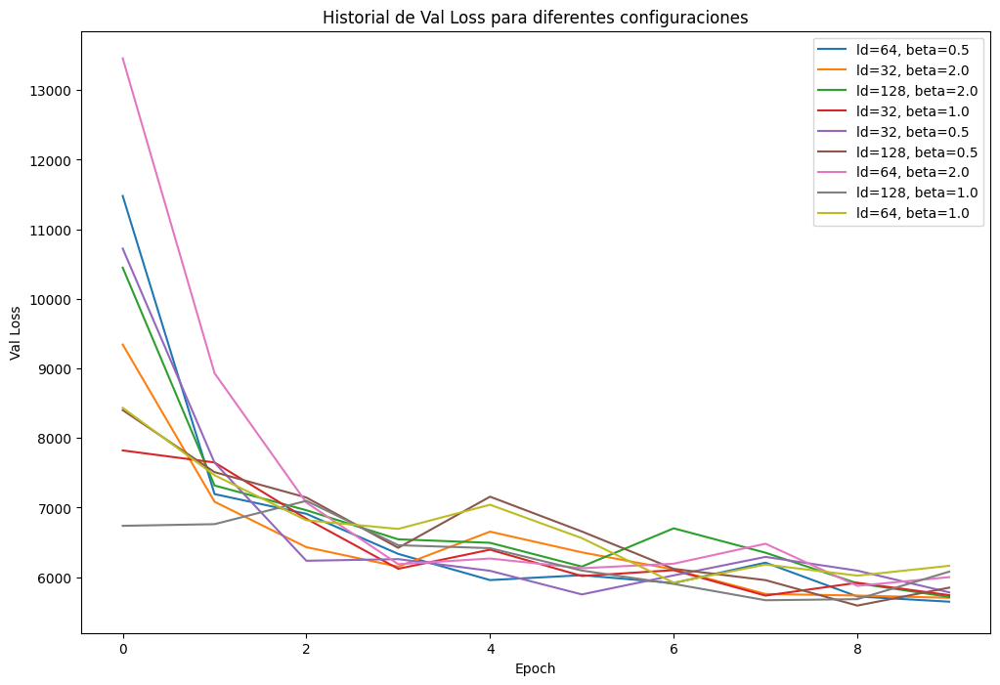

In [ ]:
best_config, all_results = evaluate_beta_and_latentdim(
    build_encoder=build_encoder,
    build_decoder=build_decoder,
    train_ds=train_ds,
    val_ds=val_ds,
    latent_dims=[32, 64, 128],
    betas=[0.5, 1.0, 2.0],
    epochs=10,
    save_dir="saved_models/basic_vae"
)

#### Entrenamiento con hiperparámetros seleccionados

In [ ]:
encoder = build_encoder(latent_dim=best_config['latent_dim'])
decoder = build_decoder(latent_dim=best_config['latent_dim'])
basic_vae = VAE(encoder, decoder, name=f"basic_vae_ld{best_config['latent_dim']}_beta{best_config['beta']}")

In [ ]:
history_basic_vae = train_model(basic_vae, train_ds, val_ds, epochs=100, beta=best_config['beta'])

Entrenando modelo `basic_vae_ld64_beta0.5`
Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 22s 3s/step - loss: 10952.0889 - val_loss: 7890.3955 - learning_rate: 0.0010
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 9s 789ms/step - loss: 7601.8032 - val_loss: 6226.4326 - learning_rate: 0.0010
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 7s 395ms/step - loss: 6821.3984 - val_loss: 6488.8457 - learning_rate: 0.0010
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 41s 7s/step - loss: 6440.1333 - val_loss: 5859.4473 - learning_rate: 0.0010
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 48s 649ms/step - loss: 6266.8120 - val_loss: 5898.0312 - learning_rate: 0.0010
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 392ms/step - loss: 6041.2344 - val_loss: 5890.8701 - learning_rate: 0.0010
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 14s 2s/step - loss: 5598.6255 - val_loss: 5511.6377 - learning_rate: 0.0010
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - loss: 5630.8003 - val_loss: 5269.3320 - learning_rate: 0.0010
Epoch 9/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 21s 2s

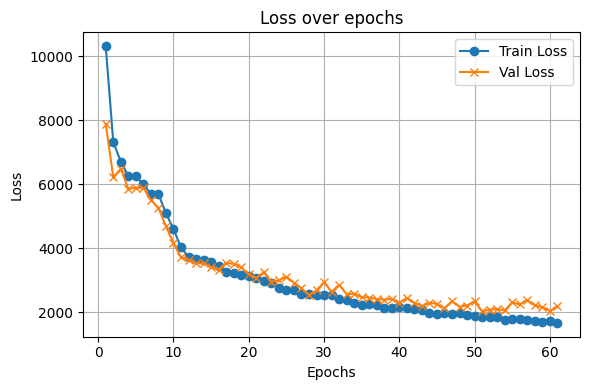

In [ ]:
plot_training_history(history_basic_vae)

### VAE Básico con regularización

####  Evaluación inicial de configuraciones



Probando latent_dim=32, beta=0.5
Epoch 1/20
6/6 ━━━━━━━━━━━━━━━━━━━━ 22s 2s/step - loss: 11417.7998 - val_loss: 11578.6143
Epoch 2/20
6/6 ━━━━━━━━━━━━━━━━━━━━ 10s 562ms/step - loss: 9979.6250 - val_loss: 7672.8896
Epoch 3/20
6/6 ━━━━━━━━━━━━━━━━━━━━ 7s 491ms/step - loss: 7790.4097 - val_loss: 6688.1519
Epoch 4/20
6/6 ━━━━━━━━━━━━━━━━━━━━ 8s 794ms/step - loss: 7250.5024 - val_loss: 6367.5083
Epoch 5/20
6/6 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - loss: 6939.1426 - val_loss: 6071.3022
Epoch 6/20
6/6 ━━━━━━━━━━━━━━━━━━━━ 15s 333ms/step - loss: 6330.3262 - val_loss: 6570.0005
Epoch 7/20
6/6 ━━━━━━━━━━━━━━━━━━━━ 17s 2s/step - loss: 6163.6011 - val_loss: 5969.4819
Epoch 8/20
6/6 ━━━━━━━━━━━━━━━━━━━━ 15s 820ms/step - loss: 6161.8818 - val_loss: 5844.0684
Epoch 9/20
6/6 ━━━━━━━━━━━━━━━━━━━━ 9s 540ms/step - loss: 5810.1157 - val_loss: 5491.8984
Epoch 10/20
6/6 ━━━━━━━━━━━━━━━━━━━━ 7s 495ms/step - loss: 5679.3071 - val_loss: 5480.1519
Epoch 11/20
6/6 ━━━━━━━━━━━━━━━━━━━━ 8s 818ms/step - loss: 5529.4

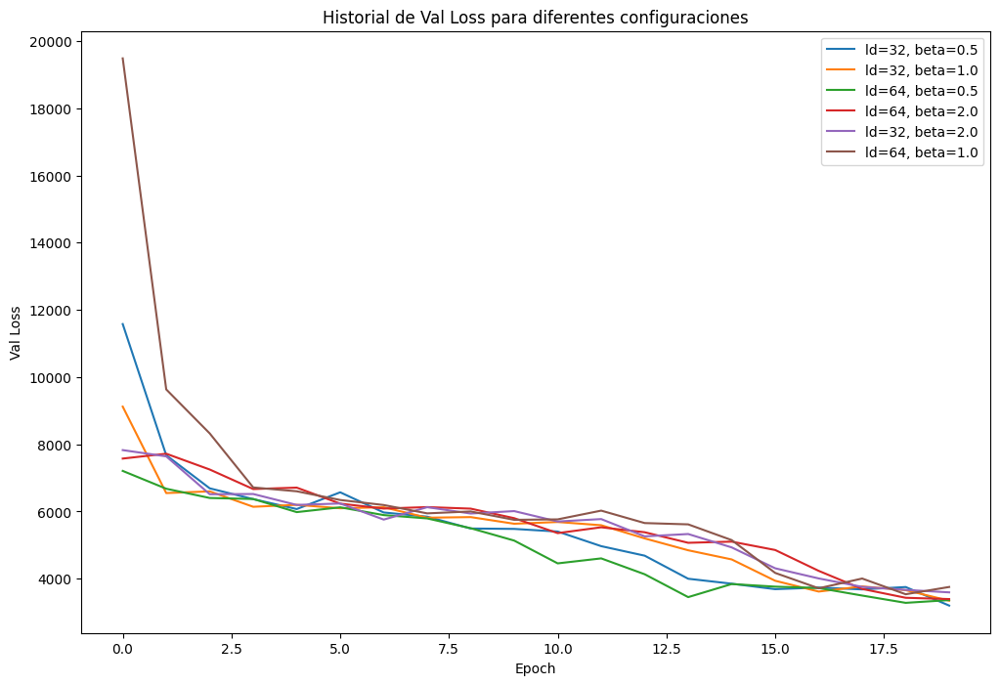

In [ ]:
best_config, all_results = evaluate_beta_and_latentdim(
    build_encoder=build_encoder_bn_dropout,
    build_decoder=build_decoder_bn_dropout,
    train_ds=train_ds,
    val_ds=val_ds,
    latent_dims=[32, 64],
    betas=[0.5, 1.0, 2.0],
    epochs=20,
    save_dir="saved_models/basic_regularization_vae"
)

#### Entrenamiento con hiperparámetros seleccionados

In [ ]:
encoder = build_encoder_bn_dropout(latent_dim=best_config['latent_dim'])
decoder = build_decoder_bn_dropout(latent_dim=best_config['latent_dim'])
basic_regularization_vae = VAE(encoder, decoder, name=f"basic_regularization_vae_ld{best_config['latent_dim']}_beta{best_config['beta']}")

In [ ]:
history_basic_regularization_vae = train_model(basic_regularization_vae, train_ds, val_ds, epochs=100, beta=best_config['beta'])

Entrenando modelo `basic_regularization_vae_ld32_beta0.5`
Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 22s 2s/step - loss: 11151.6201 - val_loss: 6781.9087 - learning_rate: 0.0010
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 9s 392ms/step - loss: 8488.9072 - val_loss: 9205.9902 - learning_rate: 0.0010
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 10s 391ms/step - loss: 8860.1816 - val_loss: 6965.3521 - learning_rate: 0.0010
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 8s 793ms/step - loss: 7605.2446 - val_loss: 6746.7495 - learning_rate: 0.0010
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 7s 541ms/step - loss: 6642.3511 - val_loss: 6171.7549 - learning_rate: 0.0010
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 8s 545ms/step - loss: 6284.2466 - val_loss: 5857.8848 - learning_rate: 0.0010
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 9s 393ms/step - loss: 6169.9585 - val_loss: 5994.9834 - learning_rate: 0.0010
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - loss: 5654.5483 - val_loss: 5696.0190 - learning_rate: 0.0010
Epoch 9/100
6/6 ━━━━━━━━

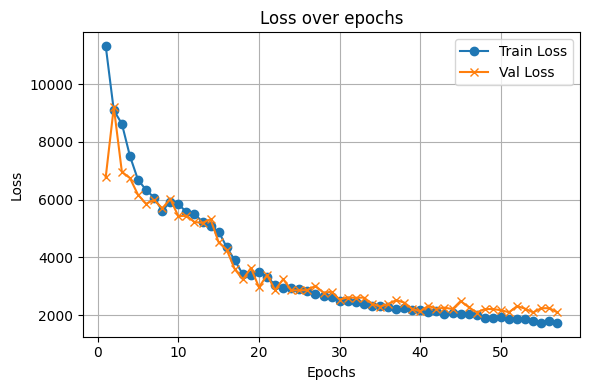

In [ ]:
plot_training_history(history_basic_regularization_vae)

### VAE Profundo

####  Evaluación inicial de configuraciones

In [ ]:
best_config, all_results = evaluate_beta_and_latentdim(
    build_encoder=build_deep_encoder,
    build_decoder=build_deep_decoder,
    train_ds=train_ds,
    val_ds=val_ds,
    latent_dims=[32, 64],
    betas=[0.5, 1.0, 2.0],
    epochs=10,
    save_dir="saved_models/deep_vae"
)



Probando latent_dim=32, beta=0.5
Epoch 1/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 39s 6s/step - loss: 11285.0195 - val_loss: 9709.6250
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 34s 5s/step - loss: 10291.5889 - val_loss: 8430.1992
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 46s 6s/step - loss: 9230.1260 - val_loss: 7755.2935
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 48s 8s/step - loss: 8079.9482 - val_loss: 7537.2886
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 75s 6s/step - loss: 7336.7617 - val_loss: 6902.3091
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 48s 7s/step - loss: 6889.4937 - val_loss: 6736.1816
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 83s 8s/step - loss: 6555.9707 - val_loss: 6453.6621
Epoch 8/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 75s 6s/step - loss: 6567.0215 - val_loss: 6276.6021
Epoch 9/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 11s 406ms/step - loss: 6593.6504 - val_loss: 6459.5146
Epoch 10/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 46s 8s/step - loss: 6372.1182 - val_loss: 6089.0894


Probando latent_dim=32, beta=1.0
Epoch 1/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 57s 9s/s

#### Entrenamiento con hiperparámetros seleccionados

In [ ]:
encoder = build_deep_encoder(latent_dim=best_config['latent_dim'])
decoder = build_deep_decoder(latent_dim=best_config['latent_dim'])
deep_vae = VAE(encoder, decoder, name=f"deep_vae_ld{best_config['latent_dim']}_beta{best_config['beta']}")

In [33]:
history_deep_vae = train_model(deep_vae, train_ds, val_ds, epochs=100, beta=best_config['beta'])

Entrenando modelo `deep_vae_ld64_beta0.5`
Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 45s 7s/step - loss: 11425.0381 - val_loss: 8839.9209 - learning_rate: 0.0010
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 82s 8s/step - loss: 9634.9609 - val_loss: 8394.0605 - learning_rate: 0.0010
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 87s 8s/step - loss: 8355.7715 - val_loss: 7387.4810 - learning_rate: 0.0010
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 66s 5s/step - loss: 7815.2627 - val_loss: 6913.6401 - learning_rate: 0.0010
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 46s 6s/step - loss: 7514.5249 - val_loss: 6724.1562 - learning_rate: 0.0010
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 12s 426ms/step - loss: 7095.0024 - val_loss: 7074.5972 - learning_rate: 0.0010
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 51s 9s/step - loss: 7021.5156 - val_loss: 6504.0854 - learning_rate: 0.0010
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 47s 8s/step - loss: 6581.4302 - val_loss: 6077.1562 - learning_rate: 0.0010
Epoch 9/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 66s 5s/step -

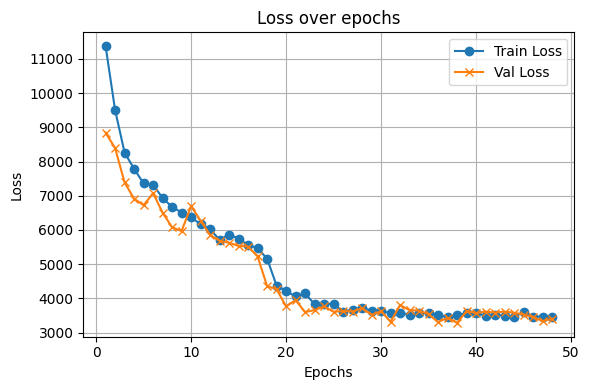

In [34]:
plot_training_history(history_deep_vae)

### VAE con residual connections

####  Evaluación inicial de configuraciones



Probando latent_dim=32, beta=0.5
Epoch 1/10
     23/Unknown 39s 559ms/step - loss: 10060.8564

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()
/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_api.py:107: UserWarning: You are saving a model that has not yet been built. It might not contain any weights yet. Consider building the model first by calling it on some data.
  return saving_lib.save_model(model, filepath)


23/23 ━━━━━━━━━━━━━━━━━━━━ 56s 1s/step - loss: 10003.5781 - val_loss: 6394.4067
Epoch 2/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 13s 389ms/step - loss: 7020.8174 - val_loss: 5806.0889
Epoch 3/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 8s 194ms/step - loss: 6102.8145 - val_loss: 6064.4272
Epoch 4/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 16s 440ms/step - loss: 5397.4727 - val_loss: 3912.6772
Epoch 5/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 13s 431ms/step - loss: 3933.2229 - val_loss: 3837.7444
Epoch 6/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 20s 696ms/step - loss: 3854.8994 - val_loss: 3477.5400
Epoch 7/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 14s 453ms/step - loss: 3755.0640 - val_loss: 3279.5569
Epoch 8/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 14s 464ms/step - loss: 3644.7446 - val_loss: 3203.6208
Epoch 9/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 20s 717ms/step - loss: 3484.5447 - val_loss: 2964.9324
Epoch 10/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 9s 170ms/step - loss: 3232.4541 - val_loss: 3178.7417


Probando latent_dim=32, beta=1.0
Epoch 1/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 29s 688ms/s

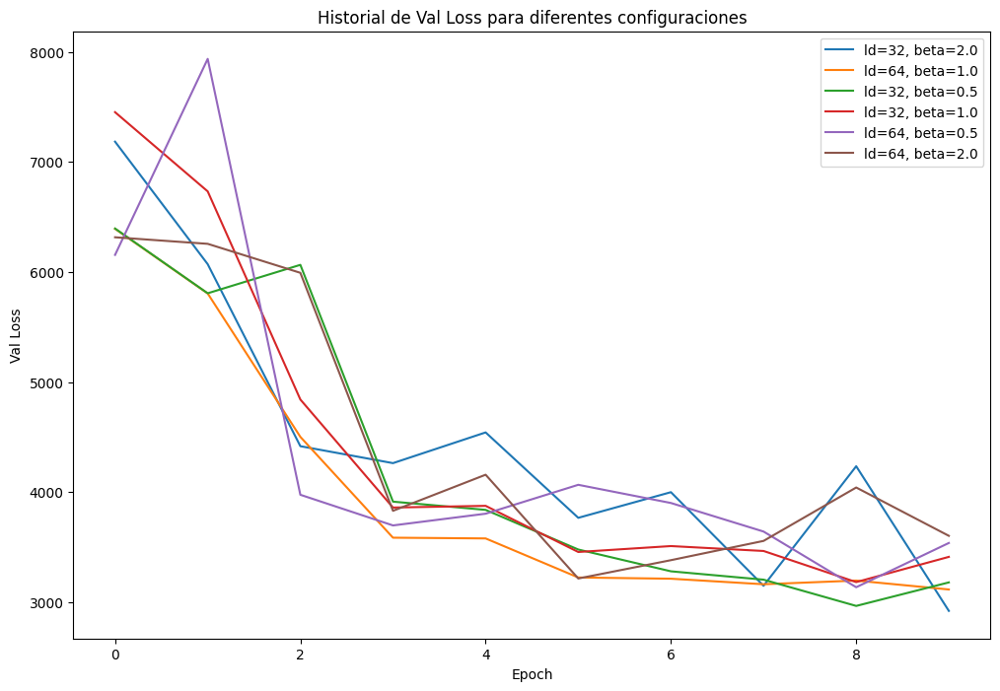

In [16]:
train_ds2 = train_ds.unbatch().batch(8)
val_ds2 = val_ds.unbatch().batch(8)
best_config, all_results = evaluate_beta_and_latentdim(
    build_encoder=build_encoder_residual,
    build_decoder=build_decoder_residual,
    train_ds=train_ds2,
    val_ds=val_ds2,
    latent_dims=[32, 64],
    betas=[0.5, 1.0, 2.0],
    epochs=10,
    save_dir="saved_models/residual_vae"
)

#### Entrenamiento con hiperparámetros seleccionados

In [17]:
encoder = build_encoder_residual(latent_dim=best_config['latent_dim'])
decoder = build_decoder_residual(latent_dim=best_config['latent_dim'])
residual_vae = VAE(encoder, decoder, name=f"residual_vae_ld{best_config['latent_dim']}_beta{best_config['beta']}")

In [18]:
history_residual_vae = train_model(residual_vae, train_ds, val_ds, epochs=100, beta=best_config['beta'])

Entrenando modelo `residual_vae_ld32_beta2.0`
Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 85s 9s/step - loss: 220932688.0000 - val_loss: 9644.8086 - learning_rate: 0.0010
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 19s 3s/step - loss: 10180.7021 - val_loss: 8490.5850 - learning_rate: 0.0010
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 20s 3s/step - loss: 8376.5684 - val_loss: 7011.4829 - learning_rate: 0.0010
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 8s 756ms/step - loss: 7487.0977 - val_loss: 7259.3604 - learning_rate: 0.0010
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - loss: 7551.9331 - val_loss: 6729.7358 - learning_rate: 0.0010
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 25s 2s/step - loss: 7187.7749 - val_loss: 6161.2881 - learning_rate: 0.0010
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - loss: 6828.9751 - val_loss: 5866.8247 - learning_rate: 0.0010
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 12s 611ms/step - loss: 6578.4297 - val_loss: 6487.4790 - learning_rate: 0.0010
Epoch 9/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 8s

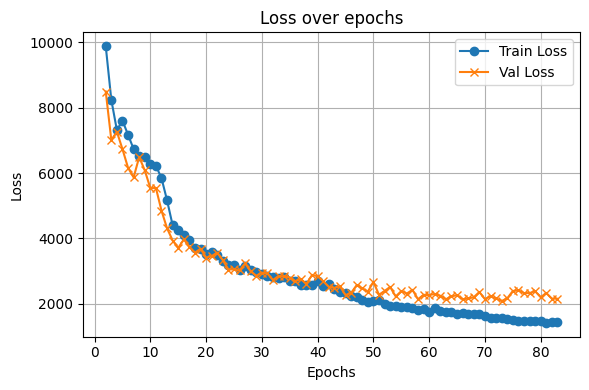

In [31]:
history_dict = history_residual_vae.history
epochs = range(2, len(history_dict['loss']) + 1)

plt.figure(figsize=(6, 4))
plt.plot(epochs, history_dict['loss'][1:], label='Train Loss', marker='o')

val_loss_key = 'val_loss'
if val_loss_key in history_dict:
    plt.plot(epochs, history_dict[val_loss_key][1:], label='Val Loss', marker='x')

plt.title('Loss over epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

## Evaluación del modelo

In [20]:
def iou_score(y_true, y_pred):
    intersection = np.logical_and(y_true, y_pred).sum()
    union = np.logical_or(y_true, y_pred).sum()
    return intersection / union if union != 0 else 1.0

def dice_score(y_true, y_pred):
    intersection = np.logical_and(y_true, y_pred).sum()
    return 2 * intersection / (y_true.sum() + y_pred.sum()) if (y_true.sum() + y_pred.sum()) != 0 else 1.0

def compute_error_maps_and_scores(model, originals):
    reconstructed = model.predict(originals)
    error_maps = np.mean((originals - reconstructed) ** 2, axis=-1)  # (N, H, W)
    scores = np.mean(error_maps, axis=(1, 2))  # (N,)
    return reconstructed, error_maps, scores

def compute_image_metrics(labels, scores, threshold=None):
    labels = np.array(labels)
    if threshold is None:
        threshold = np.percentile(scores[labels == 0], 95)
        print(f"Umbral automático (95% good): {threshold:.4f}")
    y_pred = scores > threshold

    cm = confusion_matrix(labels, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Normal", "Defecto"])
    disp.plot(cmap='Blues', values_format='d')
    plt.title("Matriz de Confusión")
    plt.show()

    image_auc = roc_auc_score(labels, scores)
    print(f"\nROC-AUC (imagen): {image_auc:.4f}")

    return y_pred, threshold

def compute_pixel_metrics(masks, labels, error_maps, threshold):
    labels = np.array(labels)
    mask_flat = masks[labels == 1].reshape(-1)
    errors_flat = error_maps[labels == 1].reshape(-1)
    pixel_auc = roc_auc_score(mask_flat > 0.5, errors_flat)
    print(f"ROC-AUC (pixel): {pixel_auc:.4f}")

    predicted_masks = error_maps > threshold

    y_true_pixels = masks.reshape(-1) > 0.5
    y_pred_pixels = predicted_masks.reshape(-1)

    precision = precision_score(y_true_pixels, y_pred_pixels)
    recall = recall_score(y_true_pixels, y_pred_pixels)
    f1 = f1_score(y_true_pixels, y_pred_pixels)
    iou = iou_score(y_true_pixels, y_pred_pixels)
    dice = dice_score(y_true_pixels, y_pred_pixels)

    print(f"\nMétricas a nivel pixel:")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1-score: {f1:.4f}")
    print(f"IoU: {iou:.4f}")
    print(f"Dice: {dice:.4f}")

    return predicted_masks

def plot_examples(originals, reconstructed, error_maps, masks, predicted_masks, labels, y_pred):
    random_indices = np.random.choice(len(originals), size=3, replace=False)
    for i in random_indices:
        plt.figure(figsize=(15, 4))

        plt.subplot(1, 5, 1)
        plt.imshow(originals[i])
        plt.title("Original")
        plt.axis('off')

        plt.subplot(1, 5, 2)
        plt.imshow(reconstructed[i])
        plt.title("Reconstrucción")
        plt.axis('off')

        plt.subplot(1, 5, 3)
        plt.imshow(error_maps[i], cmap='hot')
        plt.title("Mapa error")
        plt.axis('off')

        plt.subplot(1, 5, 4)
        plt.imshow(predicted_masks[i], cmap='gray')
        plt.title("Máscara Predicha")
        plt.axis('off')

        plt.subplot(1, 5, 5)
        plt.imshow(masks[i], cmap='gray')
        plt.title("Máscara GT")
        plt.axis('off')

        plt.suptitle(f"Label: {'Defecto' if labels[i] == 1 else 'Normal'} - Pred: {'Defecto' if y_pred[i] else 'Normal'}")
        plt.tight_layout()
        plt.show()

### VAE Básico

5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step
Umbral automático (95% good): 0.0141


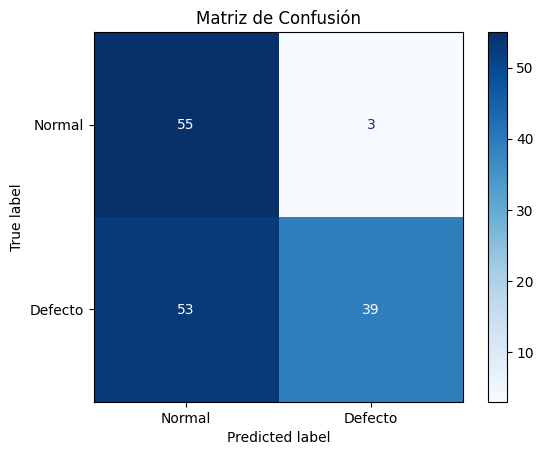


ROC-AUC (imagen): 0.7813

Reporte clasificación imagen:
              precision    recall  f1-score   support

      Normal       0.51      0.95      0.66        58
     Defecto       0.93      0.42      0.58        92

    accuracy                           0.63       150
   macro avg       0.72      0.69      0.62       150
weighted avg       0.77      0.63      0.61       150



In [ ]:
reconstructed, error_maps, scores = compute_error_maps_and_scores(basic_vae, test_images)
y_pred, threshold = compute_image_metrics(test_labels, scores)

# Reporte clasificación imagen
print("\nReporte clasificación imagen:")
print(classification_report(test_labels, y_pred, target_names=["Normal", "Defecto"]))

In [ ]:
# Métricas a nivel pixel y máscara predicha
predicted_masks = compute_pixel_metrics(test_masks, test_labels, error_maps, threshold)

# Reporte clasificación pixel
y_true_pixels = test_masks.reshape(-1) > 0.5
y_pred_pixels = predicted_masks.reshape(-1)
print("\nReporte clasificación pixel:")
print(classification_report(y_true_pixels, y_pred_pixels, target_names=["Normal", "Defecto"]))

ROC-AUC (pixel): 0.8417

Métricas a nivel pixel:
Precision: 0.1071
Recall: 0.7251
F1-score: 0.1866
IoU: 0.1029
Dice: 0.1866

Reporte clasificación pixel:
              precision    recall  f1-score   support

      Normal       0.99      0.82      0.90   9550483
     Defecto       0.11      0.73      0.19    279917

    accuracy                           0.82   9830400
   macro avg       0.55      0.77      0.54   9830400
weighted avg       0.97      0.82      0.88   9830400



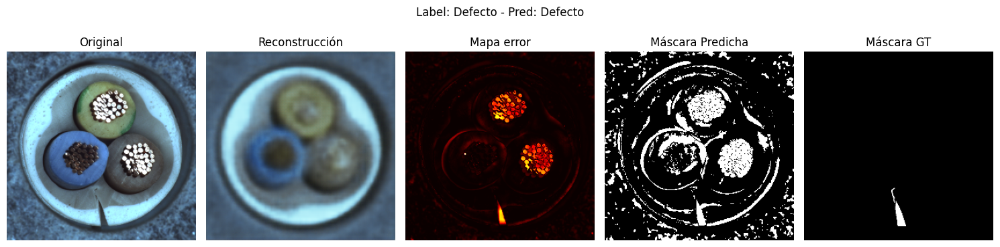

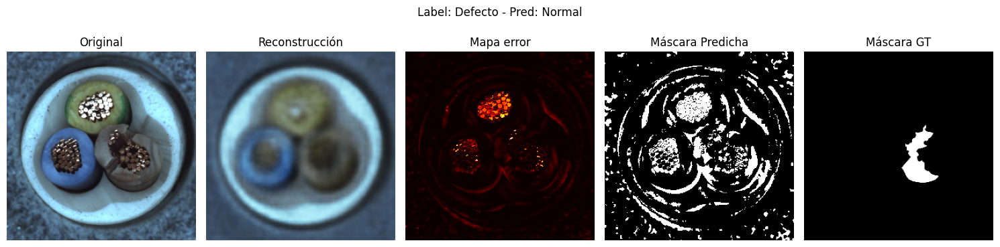

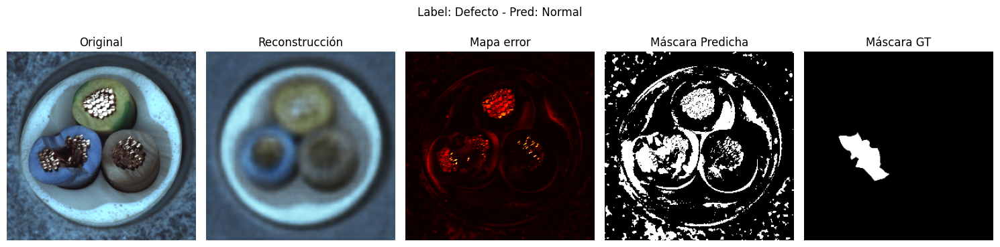

In [ ]:
# Graficar ejemplos
plot_examples(test_images, reconstructed, error_maps, test_masks, predicted_masks, test_labels, y_pred)

### VAE Básico con regularización

5/5 ━━━━━━━━━━━━━━━━━━━━ 6s 713ms/step
Umbral automático (95% good): 0.0141


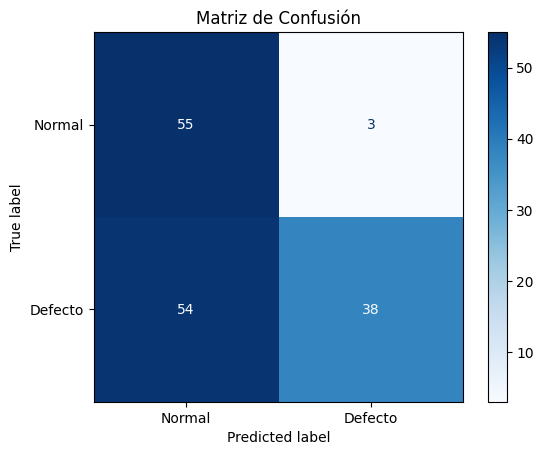


ROC-AUC (imagen): 0.7759

Reporte clasificación imagen:
              precision    recall  f1-score   support

      Normal       0.50      0.95      0.66        58
     Defecto       0.93      0.41      0.57        92

    accuracy                           0.62       150
   macro avg       0.72      0.68      0.62       150
weighted avg       0.76      0.62      0.61       150



In [ ]:
reconstructed, error_maps, scores = compute_error_maps_and_scores(basic_regularization_vae, test_images)
y_pred, threshold = compute_image_metrics(test_labels, scores)

# Reporte clasificación imagen
print("\nReporte clasificación imagen:")
print(classification_report(test_labels, y_pred, target_names=["Normal", "Defecto"]))

In [ ]:
# Métricas a nivel pixel y máscara predicha
predicted_masks = compute_pixel_metrics(test_masks, test_labels, error_maps, threshold)

# Reporte clasificación pixel
y_true_pixels = test_masks.reshape(-1) > 0.5
y_pred_pixels = predicted_masks.reshape(-1)
print("\nReporte clasificación pixel:")
print(classification_report(y_true_pixels, y_pred_pixels, target_names=["Normal", "Defecto"]))

ROC-AUC (pixel): 0.7735

Métricas a nivel pixel:
Precision: 0.0873
Recall: 0.6068
F1-score: 0.1526
IoU: 0.0826
Dice: 0.1526

Reporte clasificación pixel:
              precision    recall  f1-score   support

      Normal       0.99      0.81      0.89   9550483
     Defecto       0.09      0.61      0.15    279917

    accuracy                           0.81   9830400
   macro avg       0.54      0.71      0.52   9830400
weighted avg       0.96      0.81      0.87   9830400



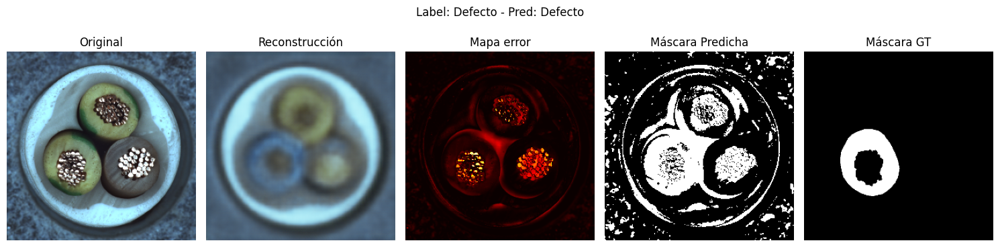

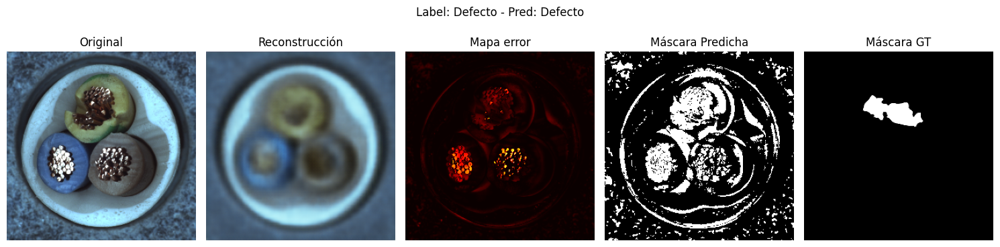

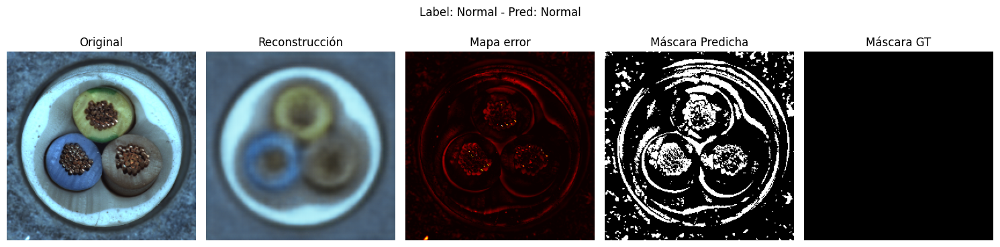

In [ ]:
# Graficar ejemplos
plot_examples(test_images, reconstructed, error_maps, test_masks, predicted_masks, test_labels, y_pred)

### VAE Profundo

5/5 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step
Umbral automático (95% good): 0.0204


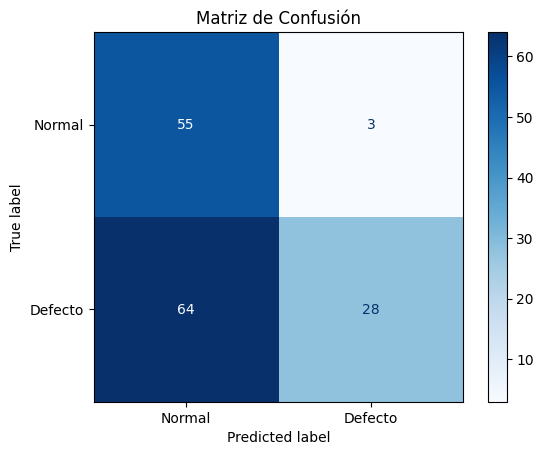


ROC-AUC (imagen): 0.6649

Reporte clasificación imagen:
              precision    recall  f1-score   support

      Normal       0.46      0.95      0.62        58
     Defecto       0.90      0.30      0.46        92

    accuracy                           0.55       150
   macro avg       0.68      0.63      0.54       150
weighted avg       0.73      0.55      0.52       150



In [36]:
reconstructed, error_maps, scores = compute_error_maps_and_scores(deep_vae, test_images)
y_pred, threshold = compute_image_metrics(test_labels, scores)

# Reporte clasificación imagen
print("\nReporte clasificación imagen:")
print(classification_report(test_labels, y_pred, target_names=["Normal", "Defecto"]))

In [ ]:
# Métricas a nivel pixel y máscara predicha
predicted_masks = compute_pixel_metrics(test_masks, test_labels, error_maps, threshold)

# Reporte clasificación pixel
y_true_pixels = test_masks.reshape(-1) > 0.5
y_pred_pixels = predicted_masks.reshape(-1)
print("\nReporte clasificación pixel:")
print(classification_report(y_true_pixels, y_pred_pixels, target_names=["Normal", "Defecto"]))

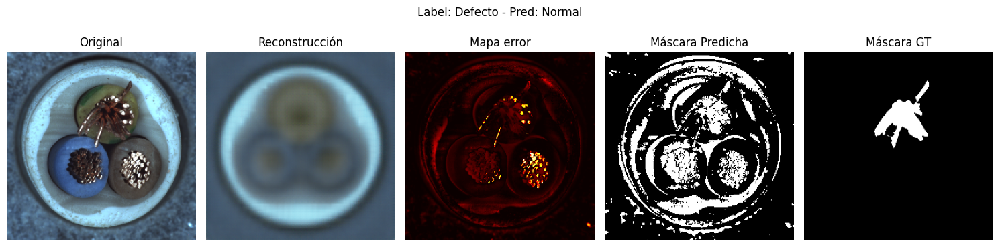

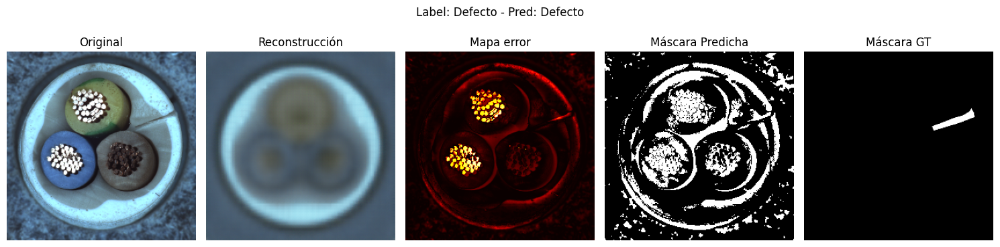

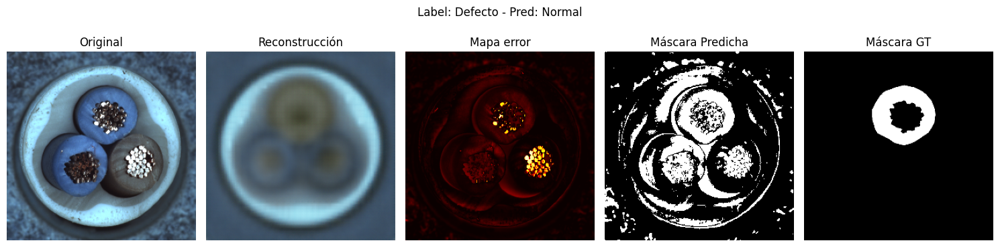

In [38]:
# Graficar ejemplos
plot_examples(test_images, reconstructed, error_maps, test_masks, predicted_masks, test_labels, y_pred)

### VAE con residual connections

5/5 ━━━━━━━━━━━━━━━━━━━━ 14s 3s/step
Umbral automático (95% good): 0.0133


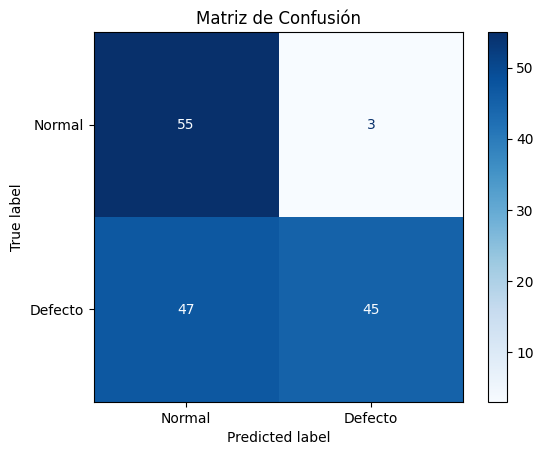


ROC-AUC (imagen): 0.7985

Reporte clasificación imagen:
              precision    recall  f1-score   support

      Normal       0.54      0.95      0.69        58
     Defecto       0.94      0.49      0.64        92

    accuracy                           0.67       150
   macro avg       0.74      0.72      0.67       150
weighted avg       0.78      0.67      0.66       150



In [25]:
reconstructed, error_maps, scores = compute_error_maps_and_scores(residual_vae, test_images)
y_pred, threshold = compute_image_metrics(test_labels, scores)

# Reporte clasificación imagen
print("\nReporte clasificación imagen:")
print(classification_report(test_labels, y_pred, target_names=["Normal", "Defecto"]))

In [26]:
# Métricas a nivel pixel y máscara predicha
predicted_masks = compute_pixel_metrics(test_masks, test_labels, error_maps, threshold)

# Reporte clasificación pixel
y_true_pixels = test_masks.reshape(-1) > 0.5
y_pred_pixels = predicted_masks.reshape(-1)
print("\nReporte clasificación pixel:")
print(classification_report(y_true_pixels, y_pred_pixels, target_names=["Normal", "Defecto"]))

ROC-AUC (pixel): 0.8069

Métricas a nivel pixel:
Precision: 0.0937
Recall: 0.6980
F1-score: 0.1652
IoU: 0.0900
Dice: 0.1652

Reporte clasificación pixel:
              precision    recall  f1-score   support

      Normal       0.99      0.80      0.89   9550483
     Defecto       0.09      0.70      0.17    279917

    accuracy                           0.80   9830400
   macro avg       0.54      0.75      0.53   9830400
weighted avg       0.96      0.80      0.87   9830400



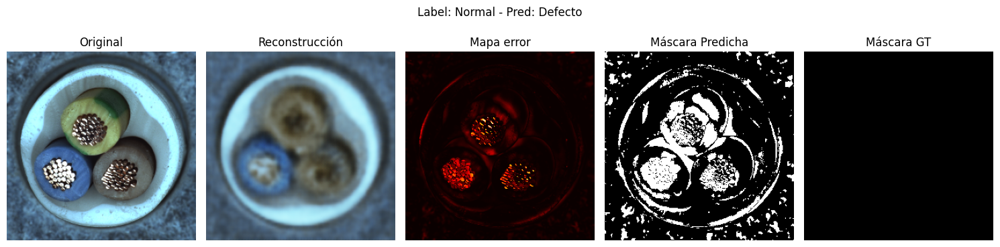

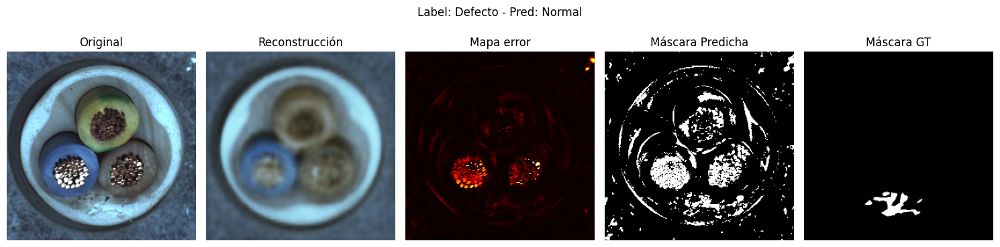

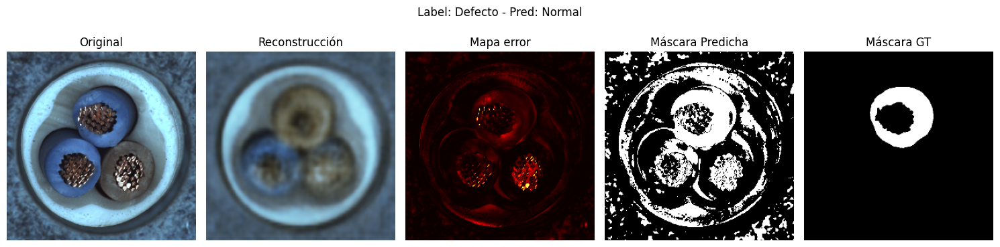

In [27]:
# Graficar ejemplos
plot_examples(test_images, reconstructed, error_maps, test_masks, predicted_masks, test_labels, y_pred)